In [7]:
import os
import sys
from pathlib import Path

def find_repo_root(start=None):
    p = Path(start or Path.cwd()).resolve()
    for _ in range(10):
        if (p / "src").exists():
            return p
        p = p.parent
    raise RuntimeError("Cannot find repo root (folder containing 'src'). Please open notebook inside the repo.")

ROOT = find_repo_root()
os.chdir(ROOT)  
sys.path.insert(0, str(ROOT))

print("Repo root:", ROOT)
print("CWD:", Path.cwd())

Repo root: /Users/yaoxintong/Group4_Emergence-of-Structure-in-a-Simplified-Universe
CWD: /Users/yaoxintong/Group4_Emergence-of-Structure-in-a-Simplified-Universe


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from matplotlib.animation import FuncAnimation, PillowWriter
from matplotlib.colors import LinearSegmentedColormap
from scipy.interpolate import griddata

plt.style.use("seaborn-v0_8-paper")
plt.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "font.family": "serif",
    "font.size": 11,
    "axes.labelsize": 12,
    "axes.titlesize": 13,
    "axes.grid": True,
    "grid.alpha": 0.3,
    "grid.linestyle": "--",
    "lines.linewidth": 2,
})

os.makedirs("figures", exist_ok=True)
os.makedirs("results", exist_ok=True)
os.makedirs("animations", exist_ok=True)

In [9]:
import matplotlib as mpl

def set_poster_style():
    mpl.rcParams.update({
        "axes.titlesize": 16,
        "axes.labelsize": 13,
        "legend.fontsize": 11,
        "xtick.labelsize": 11,
        "ytick.labelsize": 11,
        "axes.linewidth": 1.2,
        "legend.framealpha": 0.9,
        "legend.fancybox": True,
        "savefig.bbox": "tight",
        "savefig.facecolor": "white",
    })

def panel_label(ax, label):
    ax.text(
        0.02, 0.98, label,
        transform=ax.transAxes,
        ha="left", va="top",
        fontsize=14, fontweight="bold"
    )

In [10]:
from src.flocking_sim_3d import run_simulation as run_simulation_3d
from src.metrics import largest_cluster_fraction, nearest_neighbor_distance

In [11]:
def print_header(text):
    print("\n" + "=" * 70)
    print(f"  {text}")
    print("=" * 70)

In [12]:
def create_phase_diagram(
    align_values=np.linspace(0.5, 3.0, 10),
    noise_values=np.linspace(0.01, 0.10, 10),
    N=200,
    steps=400,
    R=0.15,
    speed=0.03,
    box_size=1.0,
    seeds=range(3),
    eps=0.06,
    save_every=20,
    noise_cut=0.055,
    out_png="figures/phase_diagram.png",
    out_csv="results/phase_diagram.csv",
):
    set_poster_style()
    print_header("1. Generating Research-style Phase Diagram")

    results = []
    total = len(align_values) * len(noise_values)
    counter = 0

    for align in align_values:
        for noise in noise_values:
            counter += 1
            print(f"\rProgress: {counter}/{total} ({100*counter/total:.1f}%)", end="")

            lcf_samples = []
            for seed in seeds:
                history = run_simulation_3d(
                    N=N, steps=steps,
                    align=float(align), noise=float(noise),
                    R=R, speed=speed,
                    box_size=box_size,
                    seed=int(seed),
                    save_every=save_every,
                )

                # sample last few frames (could be replaced by explicit burn-in later)
                for pos in history[-5:]:
                    lcf_samples.append(
                        largest_cluster_fraction(pos, eps=eps, box_size=box_size)
                    )

            lcf_samples = np.asarray(lcf_samples, dtype=float)
            n = lcf_samples.size
            lcf_mean = float(np.mean(lcf_samples))
            lcf_std  = float(np.std(lcf_samples, ddof=1)) if n > 1 else 0.0
            lcf_sem  = float(lcf_std / np.sqrt(max(n, 1)))

            results.append({
                "align": float(align),
                "noise": float(noise),
                "lcf": lcf_mean,
                "lcf_std": lcf_std,
                "lcf_sem": lcf_sem,
                "n_samples": int(n),
            })

    print("\n✓ Simulation completed")

    df = pd.DataFrame(results)
    df.to_csv(out_csv, index=False)

    # ---- interpolation grid ----
    align_fine = np.linspace(min(align_values), max(align_values), 200)
    noise_fine = np.linspace(min(noise_values), max(noise_values), 200)
    A_fine, N_fine = np.meshgrid(align_fine, noise_fine)

    Z = griddata(
        df[["align", "noise"]].values,
        df["lcf"].values,
        (A_fine, N_fine),
        method="cubic",
    )

    # robust contrast for color scale
    vmin, vmax = np.nanpercentile(Z, [5, 95])

    # custom red-blue colormap
    colors = ["#2166ac", "#4393c3", "#92c5de", "#d1e5f0",
              "#fddbc7", "#f4a582", "#d6604d", "#b2182b"]
    cmap = LinearSegmentedColormap.from_list("custom", colors, N=200)

    # ---- layout (ONE figure) ----
    fig = plt.figure(figsize=(12, 9))
    gs = fig.add_gridspec(
        2, 2,
        height_ratios=[3, 1],
        width_ratios=[20, 1],
        hspace=0.3,
        wspace=0.05
    )

    ax_main = fig.add_subplot(gs[0, 0])
    ax_cbar = fig.add_subplot(gs[0, 1])
    ax_cut  = fig.add_subplot(gs[1, 0])

    panel_label(ax_main, "(a)")
    panel_label(ax_cut, "(b)")

    # lock axis ranges
    x0, x1 = float(min(align_values)), float(max(align_values))
    y0, y1 = float(min(noise_values)), float(max(noise_values))
    xp = 0.02 * (x1 - x0)
    yp = 0.02 * (y1 - y0)
    ax_main.set_xlim(x0 - xp, x1 + xp)
    ax_main.set_ylim(y0 - yp, y1 + yp)

    # ordered/disordered background mask
    Z_mask = (Z >= 0.5).astype(float)
    ax_main.contourf(
        A_fine, N_fine, Z_mask,
        levels=[-0.5, 0.5, 1.5],
        alpha=0.12
    )

    # main heatmap
    im = ax_main.pcolormesh(
        A_fine, N_fine, Z,
        cmap=cmap,
        vmin=vmin, vmax=vmax,
        shading="auto"
    )

    # contour lines
    levels = [0.05, 0.08, 0.11, 0.14]
    contours = ax_main.contour(
        A_fine, N_fine, Z,
        levels=levels,
        colors="black",
        linewidths=1.3,
        alpha=0.6,
        linestyles="--"
    )
    ax_main.clabel(contours, inline=True, fontsize=9, fmt="%.2f")

    # simulation points
    ax_main.scatter(
        df["align"], df["noise"],
        c="white", s=18,
        edgecolors="black",
        linewidths=0.5,
        alpha=0.6,
        zorder=5,
        label="Simulation points"
    )

    ax_main.text(
        x0 + 0.2, y1 - 0.02,
        "Low-coherence region",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="white",
                  edgecolor="black", alpha=0.9, linewidth=1.2),
        weight="bold"
    )
    ax_main.text(
        x1 - 1.2, y0 + 0.02,
        "Higher-coherence region",
        bbox=dict(boxstyle="round,pad=0.5", facecolor="white",
                  edgecolor="black", alpha=0.9, linewidth=1.2),
        weight="bold"
    )

    ax_main.set_xlabel("Alignment Strength J", weight="bold")
    ax_main.set_ylabel("Noise Level η", weight="bold")
    ax_main.set_title("Phase Diagram: Flocking Model (Vicsek-type)", weight="bold", pad=12)
    ax_main.legend(loc="upper right", framealpha=0.9)

    # colorbar
    cbar = plt.colorbar(im, cax=ax_cbar)
    cbar.set_label("Largest Cluster Fraction (LCF)", rotation=270, labelpad=20, weight="bold")

    # cross-section at noise_cut (use SEM band)
    tol = (noise_fine[1] - noise_fine[0]) * 5
    df_cut = df[np.abs(df["noise"] - noise_cut) < tol].sort_values("align")

    if len(df_cut) > 0:
        ax_cut.plot(df_cut["align"], df_cut["lcf"], "o-", label=f"η ≈ {noise_cut:.3f}")
        ax_cut.fill_between(
            df_cut["align"],
            df_cut["lcf"] - df_cut["lcf_sem"],
            df_cut["lcf"] + df_cut["lcf_sem"],
            alpha=0.25
        )

    ax_cut.set_xlabel("Alignment Strength J", weight="bold")
    ax_cut.set_ylabel("LCF", weight="bold")
    ax_cut.set_title("Cross-section at fixed noise level", style="italic")
    ax_cut.set_ylim(-0.05, 1.05)
    ax_cut.legend(framealpha=0.9)

    # save both png + pdf
    plt.savefig(out_png, bbox_inches="tight", facecolor="white")
    plt.savefig(out_png.replace(".png", ".pdf"), bbox_inches="tight", facecolor="white")
    plt.show()
    plt.close()

    print(f"✓ Saved: {out_png}")
    print(f"✓ Saved: {out_csv}")
    return df


  1. Generating Research-style Phase Diagram
Progress: 9/9 (100.0%)
✓ Simulation completed


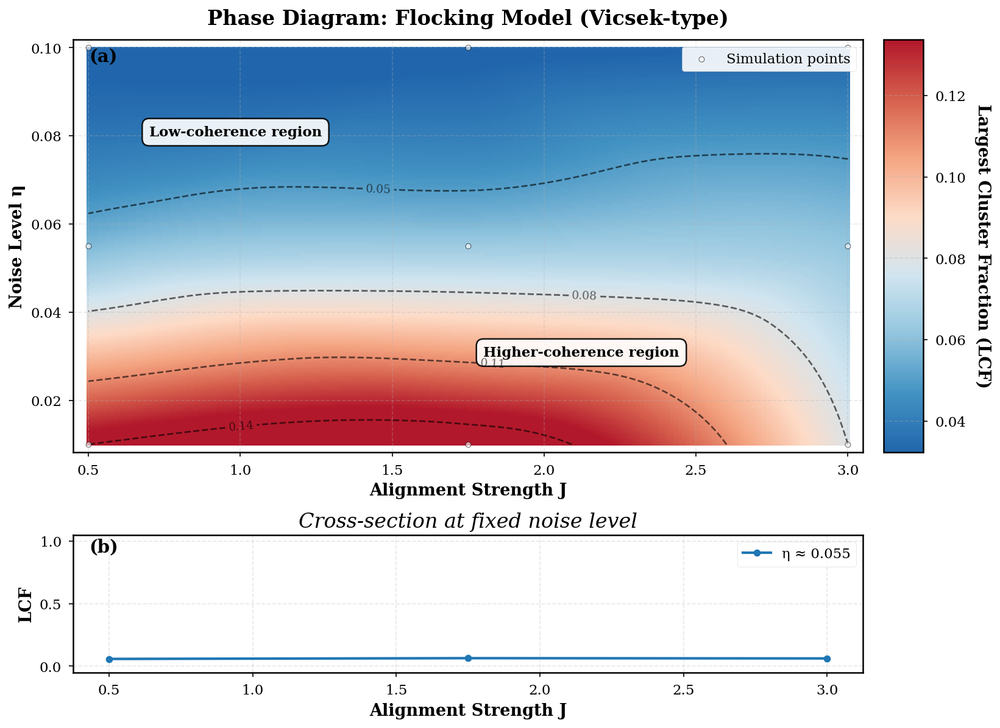

✓ Saved: figures/phase_diagram.png
✓ Saved: results/phase_diagram.csv


,align,noise,lcf,lcf_std,lcf_sem,n_samples
0,0.50,0.010,0.140,0.021506,0.009618,5
1,0.50,0.055,0.058,0.018908,0.008456,5
2,0.50,0.100,0.030,0.003536,0.001581,5
3,1.75,0.010,0.150,0.008660,0.003873,5
4,1.75,0.055,0.064,0.017819,0.007969,5


In [13]:
df_phase = create_phase_diagram(
    align_values=np.linspace(0.5, 3.0, 3),
    noise_values=np.linspace(0.01, 0.10, 3),
    seeds=range(1),
    steps=150,
    noise_cut=0.055,
)
df_phase.head()

In [14]:
from IPython.display import Image as IPyImage, display

def create_animation(
    out_gif="animations/evolution_3d.gif",
    N=150,
    steps=200,
    align=1.5,
    noise=0.06,
    R=0.15,
    speed=0.03,
    box_size=1.0,
    seed=42,
    save_every=2,
):
    print_header("2. Creating 3D Animation")

    history = run_simulation_3d(
        N=N, steps=steps, align=align, noise=noise, R=R, speed=speed,
        box_size=box_size, seed=seed, save_every=save_every
    )

    fig = plt.figure(figsize=(8, 8))
    ax = fig.add_subplot(111, projection="3d")

    def update(frame):
        ax.clear()
        pos = history[frame]
        ax.scatter(pos[:, 0], pos[:, 1], pos[:, 2], s=35, alpha=0.7, edgecolors="black", linewidths=0.3)
        ax.set_xlim(0, 1); ax.set_ylim(0, 1); ax.set_zlim(0, 1)
        ax.set_title(f"3D Flocking – Step {frame * save_every}", pad=12)

        lcf = largest_cluster_fraction(pos, eps=0.06, box_size=box_size)
        ax.text2D(0.02, 0.95, f"LCF = {lcf:.3f}", transform=ax.transAxes, bbox=dict(facecolor="white", alpha=0.85))

        ax.view_init(elev=20, azim=frame * 2)

    anim = FuncAnimation(fig, update, frames=len(history), interval=100)
    anim.save(out_gif, writer=PillowWriter(fps=10))
    plt.close()

    print(f"✓ Saved: {out_gif}")
    display(IPyImage(filename=out_gif))


  2. Creating 3D Animation
✓ Saved: animations/evolution_3d.gif


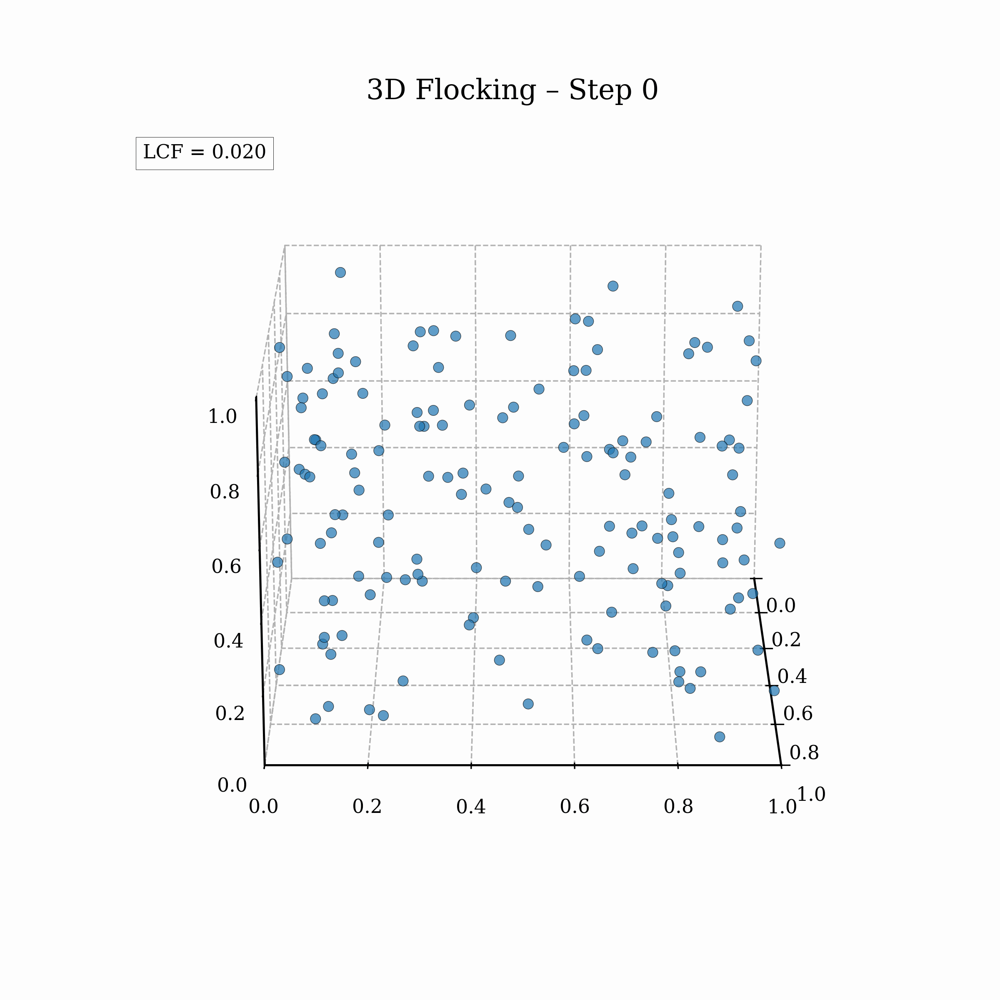

In [15]:
create_animation()

In [16]:
def advanced_parameter_sweep(
    align_values=np.linspace(0.5, 3.0, 12),
    seeds=range(5),
    noise=0.06,
    out_png="figures/advanced_sweep.png",
):
    set_poster_style()      
    print_header("3. Parameter Sweep")

    records = []
    for i, align in enumerate(align_values, 1):
        print(f"\rProgress: {i}/{len(align_values)}", end="")
        for seed in seeds:
            history = run_simulation_3d(
                N=200, steps=400, align=float(align), noise=float(noise),
                R=0.15, speed=0.03, box_size=1.0, seed=int(seed), save_every=20
            )

            lcf_vals = []
            nn_vals = []
            for pos in history[-5:]:
                lcf_vals.append(largest_cluster_fraction(pos, eps=0.06, box_size=1.0))
                nn_vals.append(nearest_neighbor_distance(pos, box_size=1.0))

            records.append({
                "align": float(align),
                "seed": int(seed),
                "lcf": float(np.mean(lcf_vals)),
                "nn": float(np.mean(nn_vals)),
            })

    print("\n✓ Done")

    df = pd.DataFrame(records)
    g = df.groupby("align")
    lcf_mean = g["lcf"].mean()
    lcf_sem  = g["lcf"].sem()                  
    nn_mean  = g["nn"].mean()
    nn_sem   = g["nn"].sem()

    # susceptibility proxy: fluctuation of order parameter across seeds
    lcf_std  = g["lcf"].std(ddof=1).fillna(0.0)

    # critical point: where fluctuation peaks
    crit_align = float(lcf_std.idxmax())

    # ----- plotting -----
    fig = plt.figure(figsize=(12, 8))
    gs = fig.add_gridspec(2, 2, height_ratios=[2.1, 1.6], hspace=0.35, wspace=0.25)

    axA = fig.add_subplot(gs[0, :])
    axB = fig.add_subplot(gs[1, 0])
    axC = fig.add_subplot(gs[1, 1])

    # (a) Order parameter
    axA.errorbar(lcf_mean.index, lcf_mean.values, yerr=lcf_sem.values, fmt="o-", capsize=4, label="Mean ± SEM")
    axA.axvline(crit_align, linestyle="--", linewidth=2, alpha=0.8, label=f"Critical ≈ {crit_align:.3f}")
    axA.set_xlabel("Alignment Strength J")
    axA.set_ylabel("Largest Cluster Fraction (LCF)")
    axA.set_title("Parameter Sweep Analysis")
    axA.set_ylim(-0.05, 1.05)

    # background regions (poster look)
    axA.axhspan(0.5, 1.05, alpha=0.10, label="Ordered")
    axA.axhspan(-0.05, 0.5, alpha=0.06, label="Disordered")

    axA.legend(loc="lower center", ncol=4)
    panel_label(axA, "(a)")

    # (b) Spatial correlation proxy (NN distance)
    axB.errorbar(nn_mean.index, nn_mean.values, yerr=nn_sem.values, fmt="s-", capsize=4, label="Mean ± SEM")
    axB.axvline(crit_align, linestyle="--", linewidth=2, alpha=0.8)
    axB.set_xlabel("Alignment Strength J")
    axB.set_ylabel("Nearest Neighbor Distance")
    axB.set_title("Spatial Correlation (proxy)")
    axB.legend()
    panel_label(axB, "(b)")

    # (c) Susceptibility (fluctuations)
    axC.plot(lcf_std.index, lcf_std.values, "o-", label="Std across seeds")
    axC.scatter([crit_align], [lcf_std.loc[crit_align]], marker="*", s=220, label=f"Peak at J≈{crit_align:.3f}")
    axC.axvline(crit_align, linestyle="--", linewidth=2, alpha=0.8)
    axC.set_xlabel("Alignment Strength J")
    axC.set_ylabel("LCF Fluctuation (std)")
    axC.set_title("Susceptibility (proxy)")
    axC.legend()
    panel_label(axC, "(c)")

    plt.savefig(out_png)
    plt.savefig(out_png.replace(".png", ".pdf"))
    plt.show()
    plt.close()

    print(f"✓ Saved: {out_png} (+ pdf)")
    return df


  3. Parameter Sweep
Progress: 12/12
✓ Done


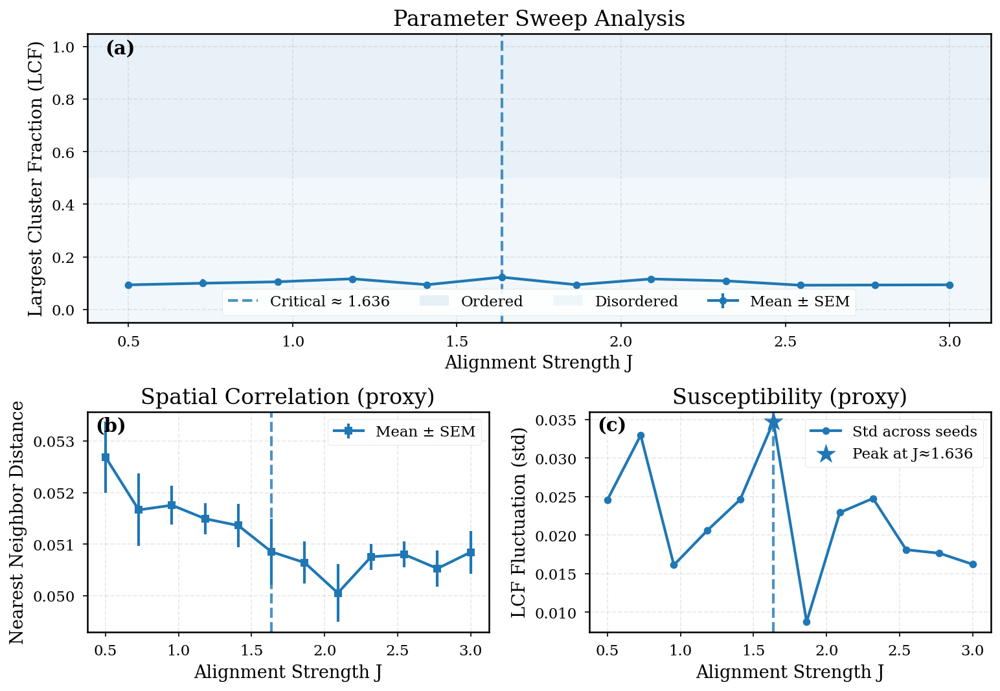

✓ Saved: figures/advanced_sweep.png (+ pdf)


,align,seed,lcf,nn
0,0.5,0,0.101,0.050636
1,0.5,1,0.091,0.053973
2,0.5,2,0.081,0.053282
3,0.5,3,0.064,0.054042
4,0.5,4,0.130,0.051510


In [17]:
df_sweep = advanced_parameter_sweep()
df_sweep.head()